In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import decimate,butter, lfilter
import tftb
import spkit as sp
import scipy.signal as signal

import time

from preprocess_frft import *

In [2]:

def do_stft(signal, fs):
    tfr = tftb.processing.Spectrogram(signal)
    tfr.run()
    tfr.plot(kind='contour', extent=[0, 1, 0, 1], show=True)


def do_fft(signal, fs):
    n = len(signal)
    T = 1/fs
    yf = np.fft.fft(signal)
    freqs = np.fft.fftfreq(n, T)  # Calculate frequencies,  if the sample spacing is in seconds, then the frequency unit is cycles/second.
    #xf = np.linspace(0.0, 1.0/(2.0*T), n//2)
    plt.plot(freqs[:len(freqs)//2], np.abs(yf)[:len(freqs)//2])  # Plot only positive frequencies
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude')
    plt.title('Frequency Spectrum')
    plt.grid(True)
    plt.show()



In [3]:
low_cut = 30
high_cut = 330
order = 5
fs = 2000

In [4]:
fs=2000
t=np.arange(0,0.2,1/fs)

(2,)
x    [[[0.016423381859003383, 0.019208135695204194]...
y                                                    1
Name: 350, dtype: object
(12, 400, 2)


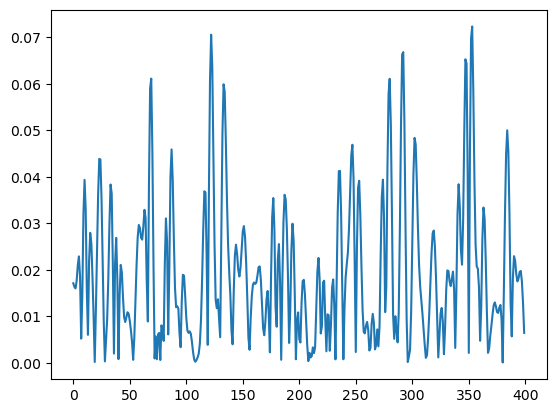

In [5]:
df = pd.read_pickle("ninapro_400_50_Full_train.pkl")
sample = df.loc[350]
print(sample.shape)
print(sample)
sample2 = sample["x"]
print(sample2.shape)
sample3 = sample2[1,:,0]
plt.plot( sample3)

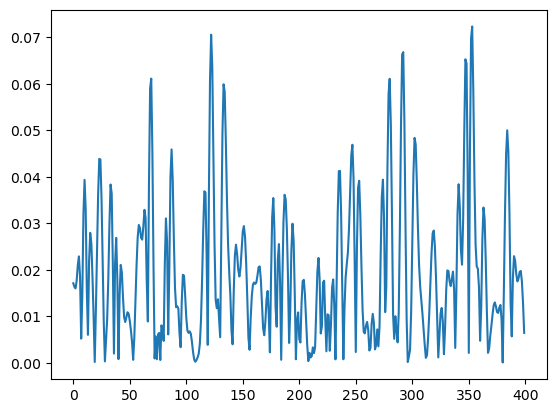

In [6]:
sample3 = sample2[1,:,0]
plt.plot( sample3)

In [7]:
ft_pic = dict()
# ft_pic["x"] = list()
ft_pic["y"] = list()

In [8]:
ch = 12


In [97]:
sample = df.loc[350]


(2,)
x    [[[0.005892719416020986, 0.00238799030771271],...
y                                                    7
Name: 4120, dtype: object
(12, 400, 2)


In [9]:

for j in range(ch):
    ft_pic["Ch" + str(j)]  =list()

In [99]:
nfft = 256
nperseg = 32

alpha = 0.72


size_arr = int( nfft /2 +1 )



In [135]:


signal_x = df.loc[1478]["x"][1,:,0]
Sx, tx =  generateTFfigure(signal_x, fs, nfft , nperseg , alpha )

In [136]:

Sx.shape

(129, 14)

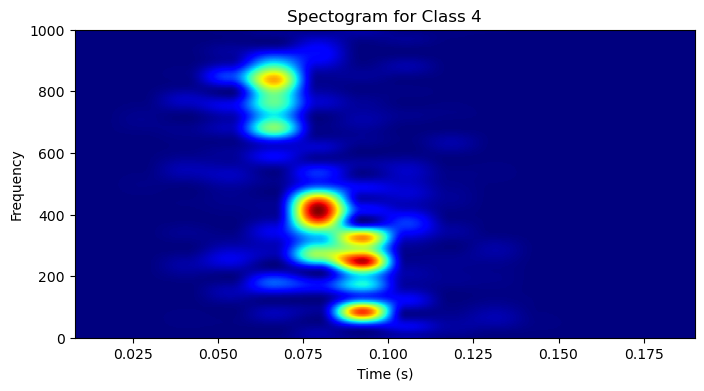

In [137]:
plt.figure(figsize=(8,4))
plt.imshow( Sx , aspect='auto',origin='lower',cmap='jet', extent=[tx[0],tx[-1],0,fs/2])
plt.title("Spectogram for Class 4")
plt.ylabel("Frequency")
plt.xlabel("Time (s)")
plt.savefig("./sample_4.pdf")

<Figure size 640x480 with 0 Axes>

In [11]:
for i,sample in enumerate(df["x"]):

    ft_pic["y"].append( df.loc[i].y)

    for j in range(ch):
        signal_x = sample[j,:,0]
        Sx, tx =  generateTFfigure(signal_x, fs, nfft , nperseg , alpha )
        ft_pic["Ch" + str(j)].append( Sx ) 
    



    

In [12]:
ft_df = pd.DataFrame.from_dict(ft_pic)
for i in range(1,18):
    ft_df.loc[ft_df["y"] == i , "y"] = str(i)

In [13]:
pd.DataFrame.to_pickle( ft_df , "./ft_df_ver1_alpha_" + str(alpha)+ ".pkl")

In [27]:
ft_df

,y,Ch0,Ch1,Ch2,Ch3,Ch4,Ch5,Ch6,Ch7,Ch8,Ch9,Ch10,Ch11
0,1,"[[8.378876879876387e-10, 1.1687648820850403e-1...","[[2.8178908445159066e-11, 6.391039414720157e-1...","[[2.089808368976072e-11, 1.017285663211689e-10...","[[3.984250848302052e-11, 4.730700679666146e-11...","[[2.5648441895484346e-10, 1.218296494213393e-1...","[[3.911084594499365e-11, 5.207527732622765e-10...","[[2.327464113364397e-10, 4.3749769358532936e-1...","[[4.02812213399294e-12, 9.440947743947446e-10,...","[[1.633585077607431e-10, 7.771398454599444e-11...","[[5.220367706714952e-10, 1.356391505132448e-10...","[[1.6738959351701076e-09, 1.40804956009239e-09...","[[4.7317947637872653e-08, 3.1045351843082406e-..."
1,1,"[[6.934367181463402e-11, 2.500049223868412e-08...","[[1.5921999177028948e-11, 6.781092252774793e-1...","[[6.2651674700209885e-12, 4.3181270833349697e-...","[[6.319107381641786e-12, 1.6339661782263384e-1...","[[2.2293264834449913e-11, 4.742477618728434e-1...","[[5.077434707720488e-12, 5.423998272631564e-11...","[[4.936462072394191e-10, 1.8867001933210094e-1...","[[2.170746947587549e-09, 1.9558590622349753e-0...","[[7.86420176775129e-11, 2.5602087660039086e-11...","[[2.9215216009792585e-11, 5.017842605169798e-1...","[[1.1651035075428462e-10, 3.3279300107106026e-...","[[5.4585420115483344e-08, 1.2916169255946122e-..."
2,1,"[[7.022927856999851e-09, 1.9209084730935014e-0...","[[2.920412249288765e-09, 4.863120923478246e-10...","[[1.1339257898071681e-10, 1.660987057060505e-1...","[[4.166273299550334e-12, 3.2004999246519604e-1...","[[2.2952761702287697e-09, 7.788712394086069e-1...","[[4.4774268476592036e-10, 8.294385788378594e-1...","[[7.189929967111727e-11, 3.829760277707729e-10...","[[1.0333473222474798e-10, 2.6263333976178644e-...","[[9.634856585236229e-11, 8.456258576158881e-11...","[[1.2808339895849024e-09, 1.440491959421083e-1...","[[3.721861689761903e-10, 3.3053516477062956e-1...","[[3.624086301098974e-11, 4.188838875291728e-07..."
3,1,"[[3.6197791050108696e-10, 1.019773195889093e-0...","[[1.922079577344336e-10, 5.149141549662714e-10...","[[2.2625461011910833e-11, 1.497622946812244e-1...","[[2.1835953649674354e-10, 2.1586986067833755e-...","[[6.13474586065577e-10, 5.413287924912693e-10,...","[[6.351690420073099e-10, 1.1453650098231672e-0...","[[2.0950918197813331e-10, 5.0465997748990385e-...","[[6.201157346718278e-09, 1.3367992407967012e-0...","[[1.1251125405458591e-10, 9.91413758678008e-12...","[[2.802866174591181e-10, 4.211106825746081e-09...","[[3.6076230614745356e-10, 1.6451791727701573e-...","[[1.9543044973568254e-09, 1.3707808495386904e-..."
4,1,"[[8.127444016101523e-12, 1.514115256461065e-10...","[[3.868770522074717e-10, 4.134032440662262e-10...","[[1.9308569884207107e-11, 2.2482441367093285e-...","[[4.3199005523739025e-11, 7.029651137015793e-1...","[[5.089678001368455e-11, 6.0723416318851954e-1...","[[3.9491732181958676e-09, 2.3507546353445277e-...","[[8.029845286438814e-09, 2.5679524404007365e-0...","[[5.143556872972507e-11, 5.825025634413639e-10...","[[1.388471440272059e-10, 6.676046619614624e-12...","[[6.525201724999286e-09, 2.331223967452382e-10...","[[8.655516687814587e-10, 3.3153296692195654e-0...","[[1.6728507835427048e-10, 4.707629542276658e-1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9454,17,"[[5.405873742739034e-09, 1.8640781209945564e-0...","[[7.55214175561742e-08, 6.2085286805099496e-09...","[[1.6840144388169144e-09, 4.174521154524316e-0...","[[1.6480779965829484e-10, 4.958945968658745e-1...","[[3.933084752925235e-09, 7.875925940064493e-09...","[[5.270224209827123e-10, 1.1937604383047234e-1...","[[5.006561302895447e-13, 1.3674840884947008e-1...","[[1.107588039935723e-09, 6.702329751895566e-08...","[[3.3656388149344925e-07, 4.6064753222795136e-...","[[1.7556085454248454e-11, 8.570124824676913e-1...","[[3.264348859150237e-08, 1.09293553037149e-09,...","[[1.520017872334836e-08, 1.205259911783661e-07..."
9455,17,"[[3.698882542159501e-10, 3.756399391691648e-10...","[[2.4865087630230856e-09, 5.627534146724864e-1...","[[4.52

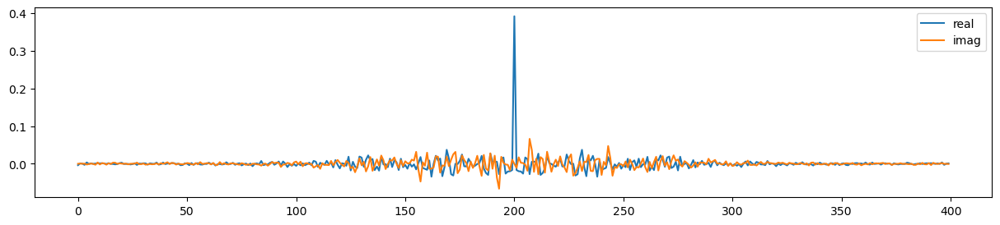

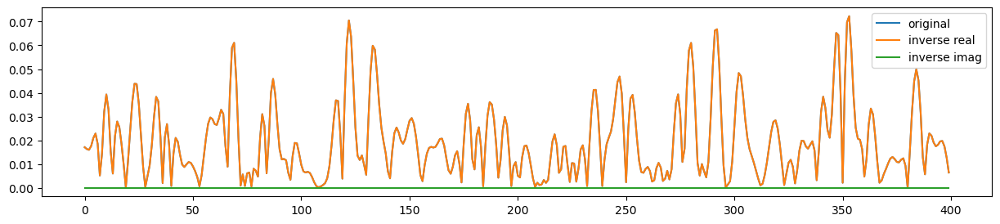

In [41]:
#Fractional Fourier Transform
y = sp.frft(sample3,alpha=1)

plt.figure(figsize=(15,3))
 
plt.plot(y.real, label='real')
plt.plot(y.imag, label='imag')
plt.legend()
plt.show()


#Inverse fractional Fourier Transform
xi = sp.frft(y,alpha=-1)

plt.figure(figsize=(15,3))
plt.plot(sample3, label='original')
plt.plot(xi.real, label='inverse real')
plt.plot(xi.imag, label='inverse imag')
plt.legend()

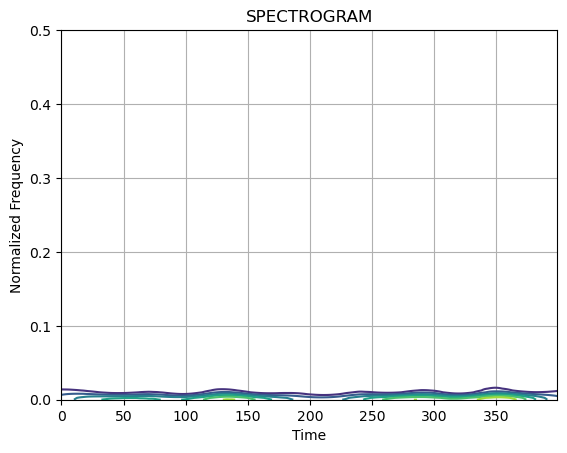

In [47]:

freq_bins = do_stft(sample3, 200)

In [130]:
# def generateTFfigure(sample, fs, nfft , nperseg , alpha ):
#     Xa = sp.frft(sample,alpha=alpha)
#     fx,tx,Sx = signal.spectrogram(Xa,fs=fs,nperseg=nperseg,nfft=nfft,return_onesided=False)
#     Sx = np.abs(Sx)

#     return Sx[:int( nfft /2 + 1)], tx



In [22]:
temp,tx = generateTFfigure(sample3, fs, 256, 32 , 0.05 )

In [23]:
temp.shape

(129, 14)

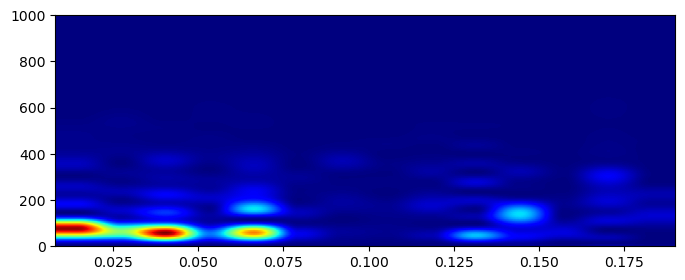

In [24]:
plt.figure(figsize=(8,3))
plt.imshow( temp , aspect='auto',origin='lower',cmap='jet', extent=[tx[0],tx[-1],0,fs/2])

(800,)

C:\Users\Erkan\AppData\Local\Temp\ipykernel_20756\1916778316.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


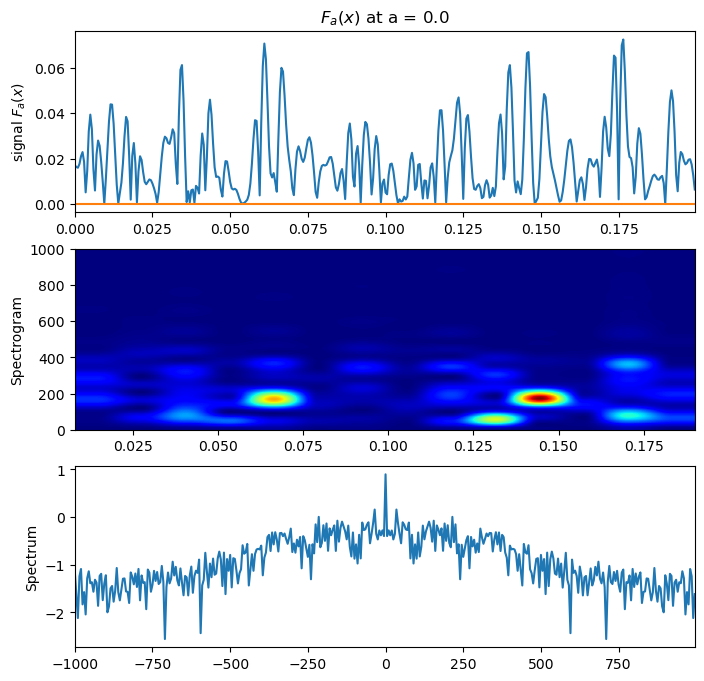

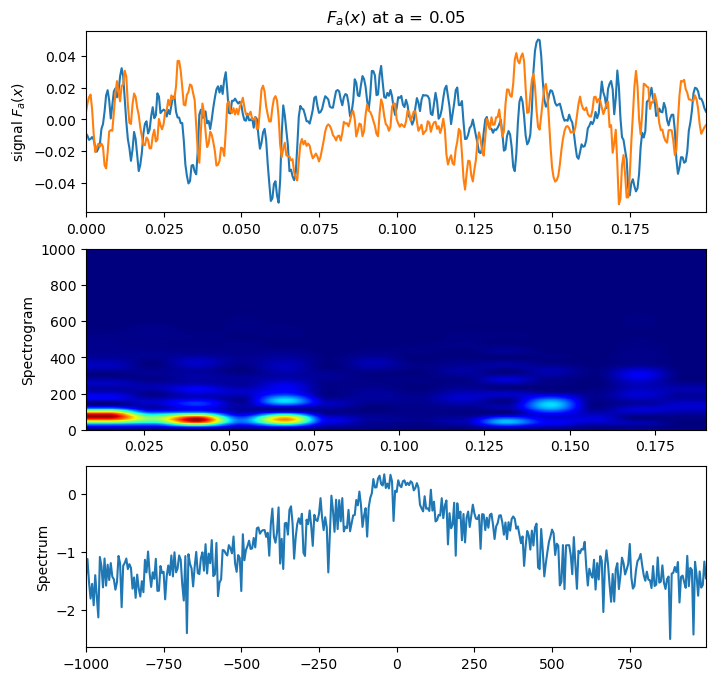

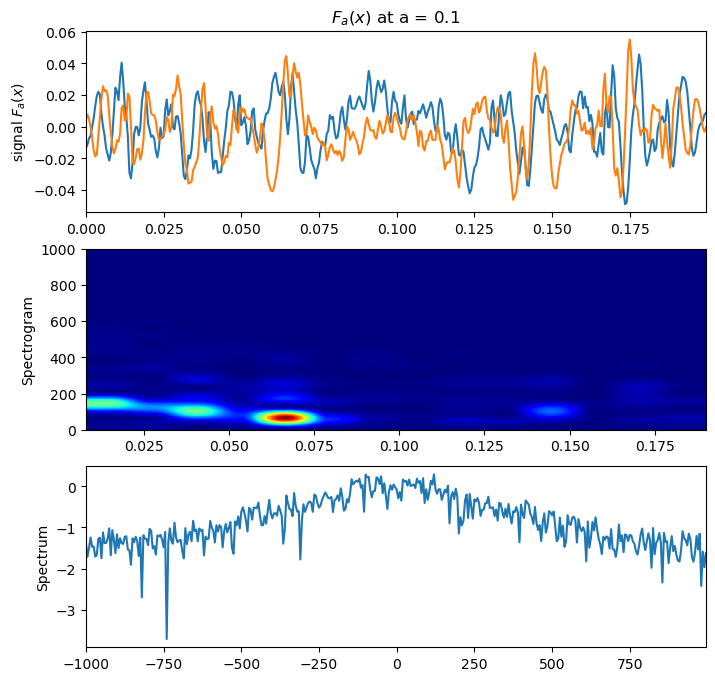

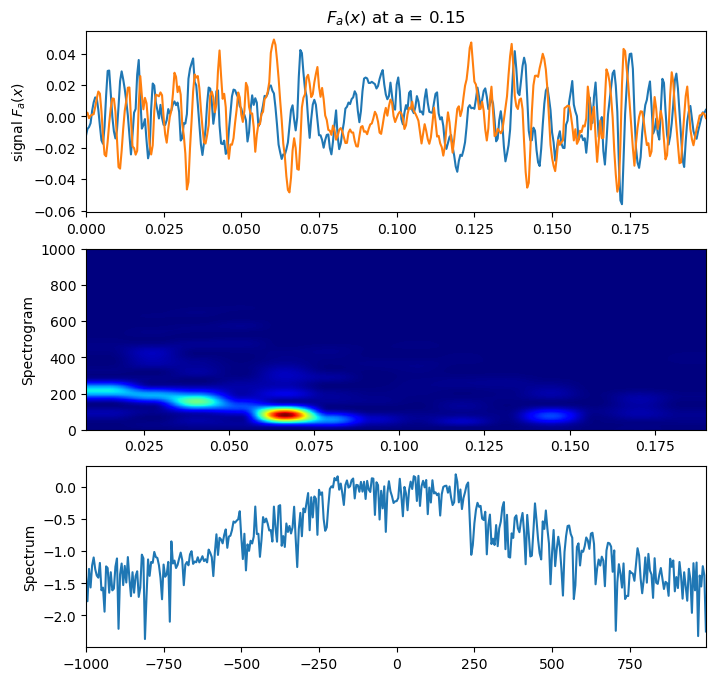

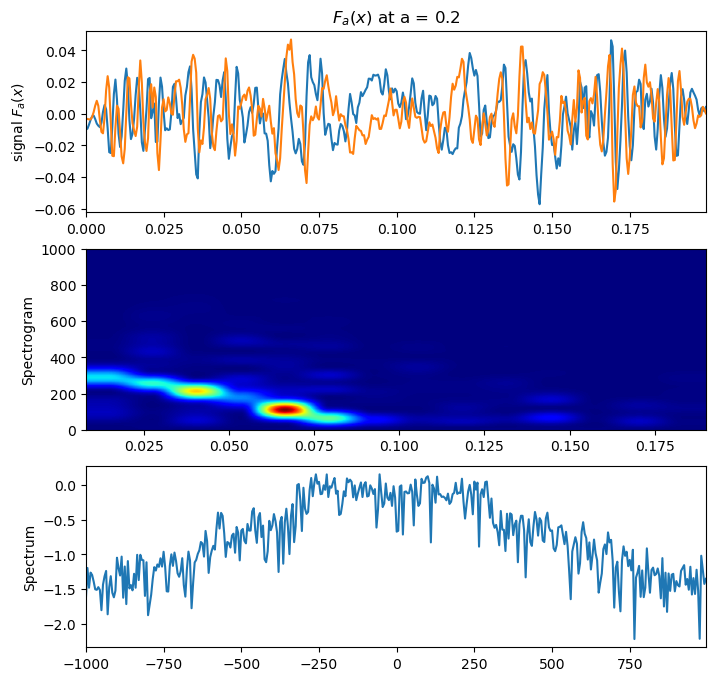

...

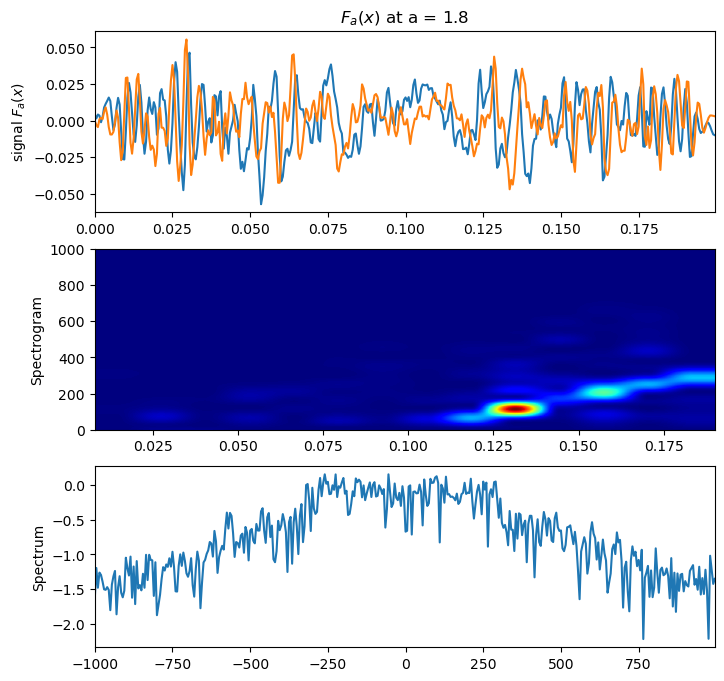

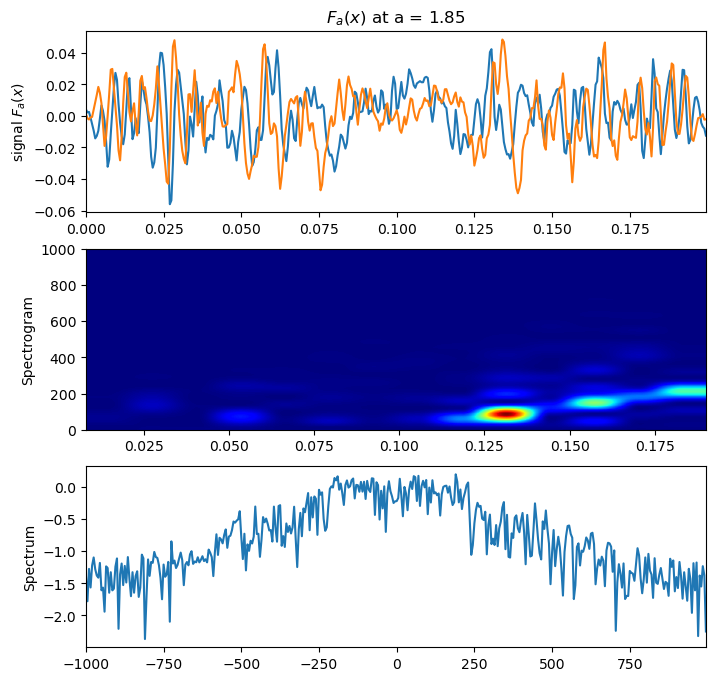

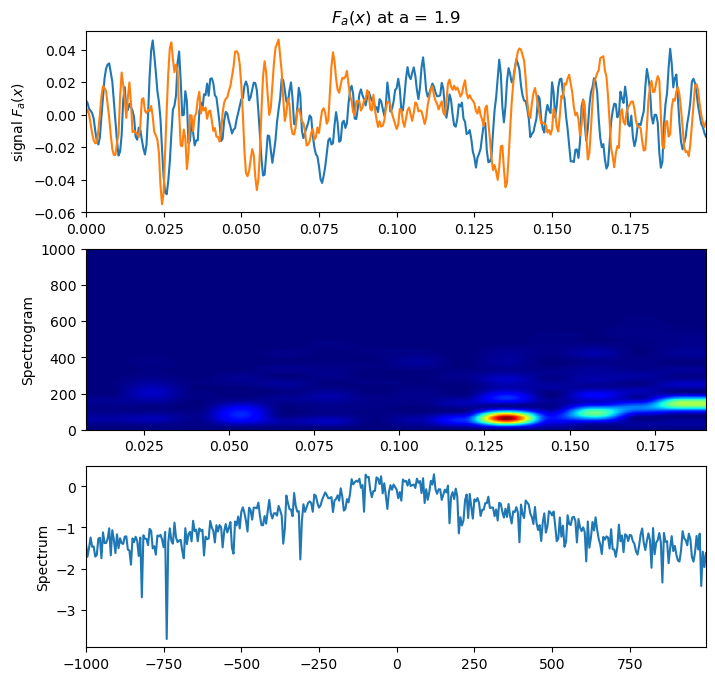

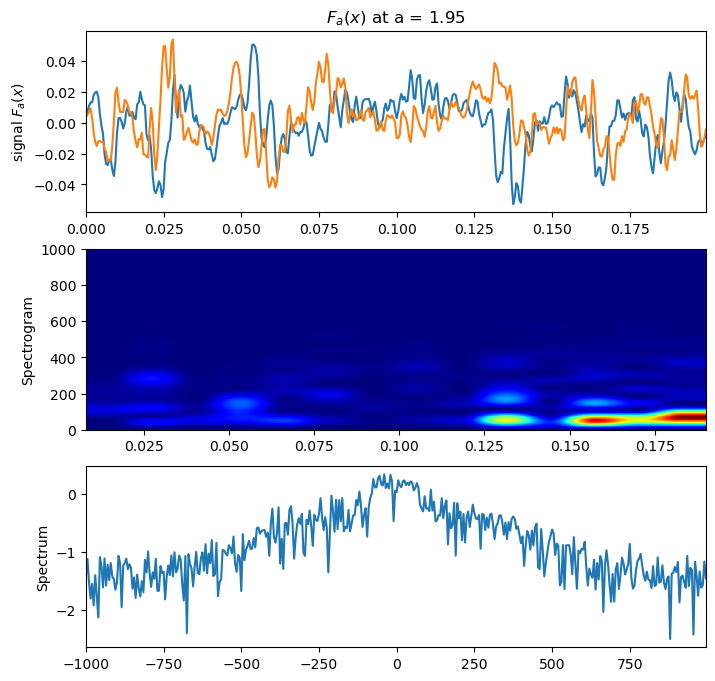

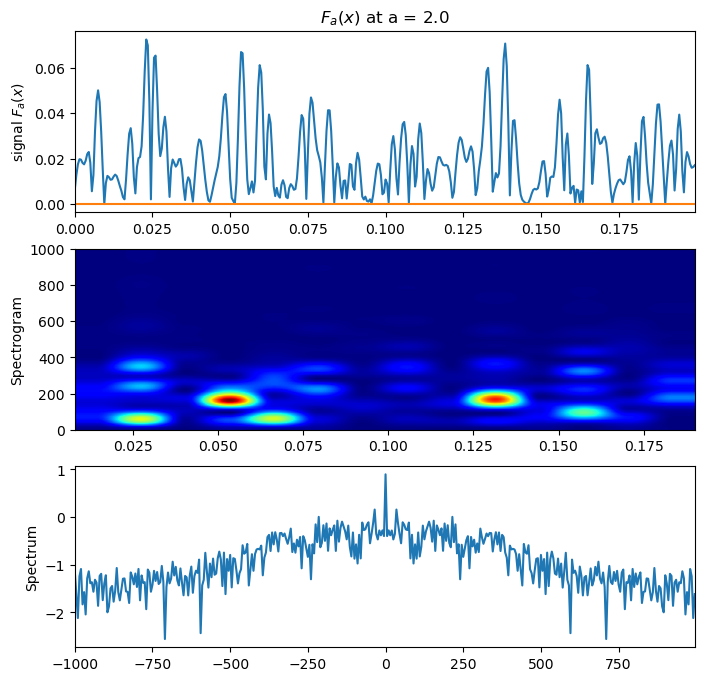

In [34]:
fs = 2000

#k=1
for alpha in np.arange(0,2.05,0.05).round(2):
    figsize=(8,8)
    fig,ax = plt.subplots(3,1,figsize =figsize)
    #Xa = FRFT(x.copy(), alpha)
    Xa = sp.frft(sample3,alpha=alpha)
    ax[0].clear()
    #ax[0].plot(t,x)
    ax[0].plot(t,Xa.real)
    ax[0].plot(t,Xa.imag)
    ax[0].set_xlim([t[0],t[-1]])
    ax[0].set_title(r'$F_a(x)$ at a = '+str(alpha))
    ax[0].set_ylabel(r'signal $F_a(x)$')
    
    fx,tx,Sx = signal.spectrogram(Xa,fs=fs,nperseg=32,nfft=256,return_onesided=False)
    Sx = np.abs(Sx)
    #Sx = np.log(np.abs(Sx))
    ax[1].clear()
    ax[1].imshow(Sx[:129], aspect='auto',origin='lower',cmap='jet', extent=[tx[0],tx[-1],0,fs/2])
    ax[1].set_ylabel('Spectrogram')
    #Fx = np.log10(np.abs(np.fft.fftshift(np.fft.fft(x))))
    Ff = np.log10(np.abs(np.fft.fftshift(np.fft.fft(Xa))))
    N = len(Ff)
    fq = fs*(np.arange(N)- (N//2))/N 
    ax[2].clear()
    #ax[2].plot(fq,Fx)
    ax[2].plot(fq,Ff)
    ax[2].set_xlim([fq[0],fq[-1]])
    ax[2].set_ylabel('Spectrum')
    #k+=1
    fig.canvas.draw()



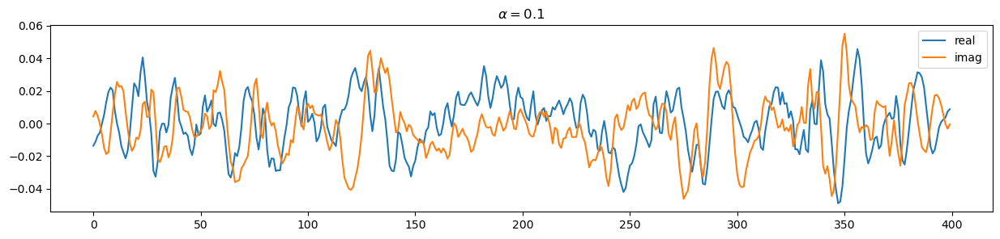

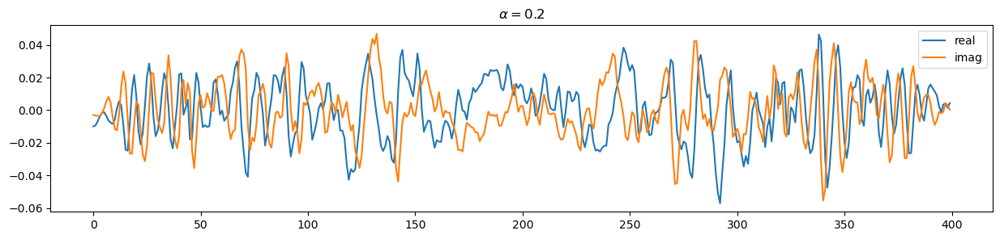

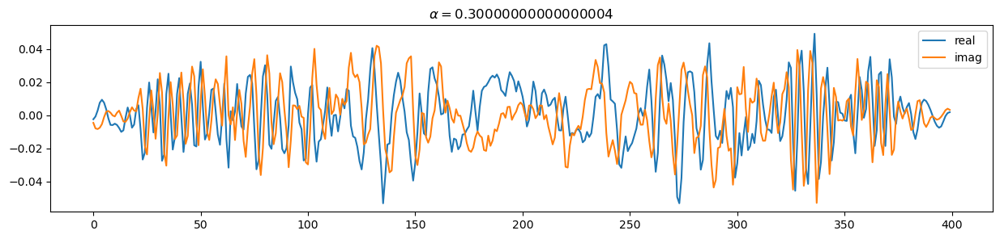

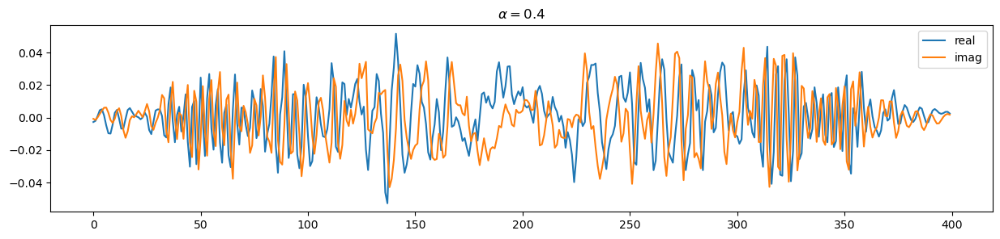

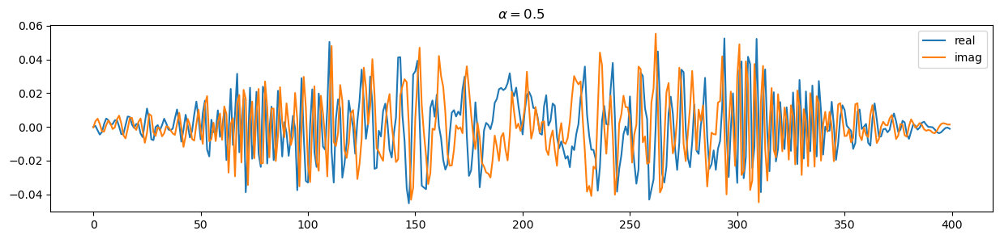

...

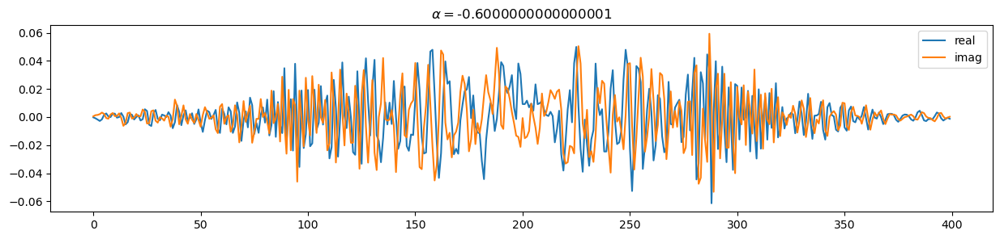

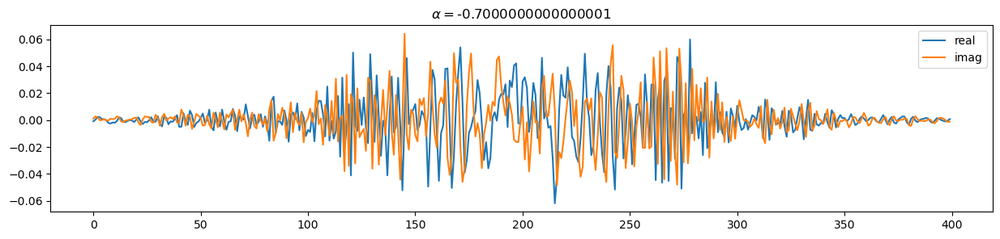

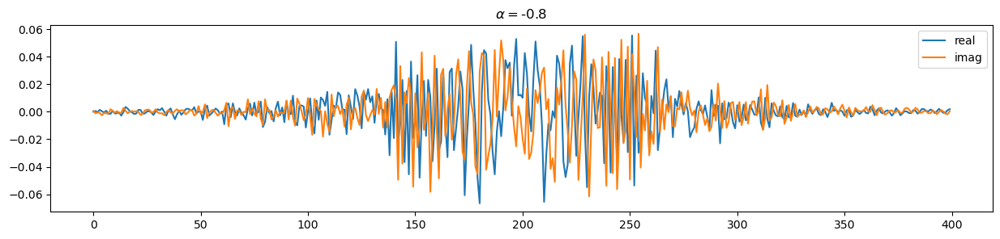

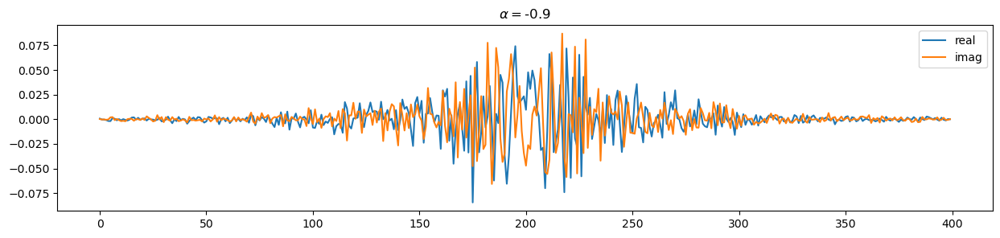

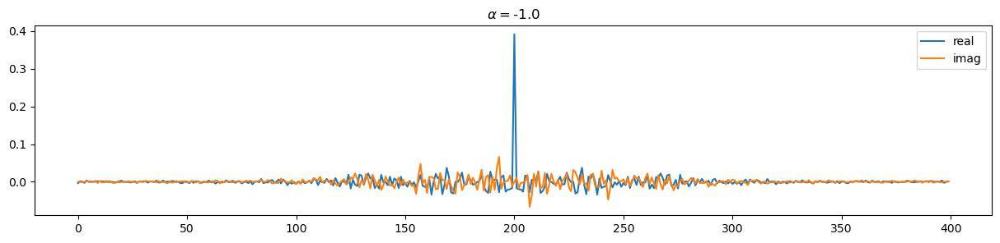

In [63]:
for j in range(2):
    for i in range(1,11):
        y = sp.frft(sample3,alpha=0.1*i*np.power(-1,j))

        plt.figure(figsize=(15,3))
        
        plt.plot(y.real, label='real')
        plt.plot(y.imag, label='imag')
        plt.title(r"$\alpha= $" + str( 0.1*i*np.power(-1,j) ) )
        plt.legend()

        plt.show()

    #Inverse fractional Fourier Transform
    # xi = sp.frft(y,alpha=-0.1*i)

    # plt.figure(figsize=(15,3))
    # plt.plot(sample3, label='original')
    # plt.plot(xi.real, label='inverse real')
    # plt.plot(xi.imag, label='inverse imag')
    # plt.plot( -xi.imag + xi.real, label='inverse imag')

    # plt.legend()
